In [1]:
import importlib
import MonoplottingFunctions
importlib.reload(MonoplottingFunctions)
from MonoplottingFunctions import *

# Image Keypoints

In [2]:
img = readImage_withScale(Path='data/Mountain_cropped.jpg', scalefactor=1)
width_img = img.shape[1]
height_img = img.shape[0]

Image_keypoints = np.loadtxt('data/ORB_imageKeyPoints.out', delimiter=',').round()

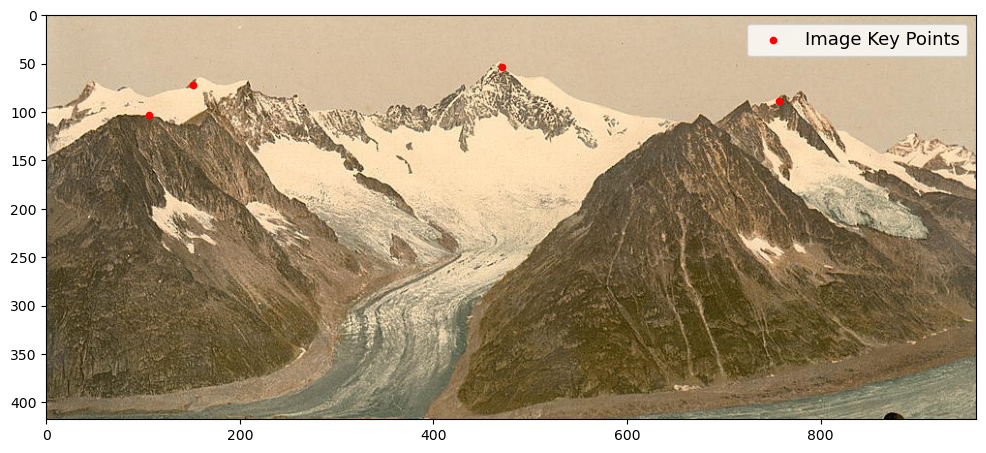

In [3]:
listSelectedImgKeyPnts = np.arange(Image_keypoints.shape[0])
listSelectedImgKeyPnts = [23 , 30, 49, 16]
Selected_Image_keypoints = Image_keypoints[listSelectedImgKeyPnts]

showImg_and_KeyPoints(img, Selected_Image_keypoints, pointfill=True, showLegend=True, showTicks=True, labelString='Image Key Points',
                      showPointNumber=False, showGrid=False, pointsize=20, fontsize=13)


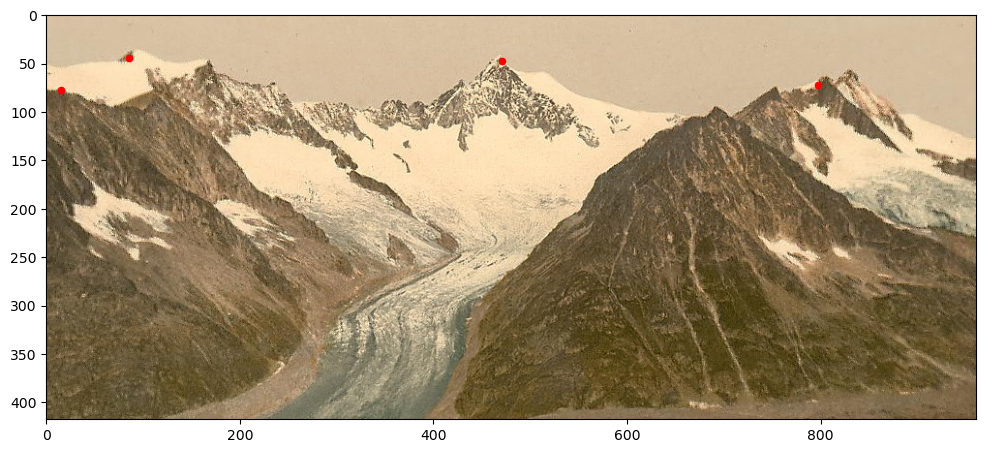

In [4]:
k_distortion_forward = +0.0000016
img_dst_fwd_inpaint, img_dst = forwardMappingImageDistortion(img, k_distortion_forward)
img_dst[np.isnan(img_dst)] = 0
img_dst = img_dst.astype(np.uint8)

distortedPoints_fwd = forwardMappingPointsDistortion(img, Selected_Image_keypoints, k_distortion_forward)

showImg_and_KeyPoints(img_dst_fwd_inpaint, distortedPoints_fwd, pointfill=True, showLegend=False,
                      showPointNumber=False, showGrid=False, pointsize=20, fontsize=13)

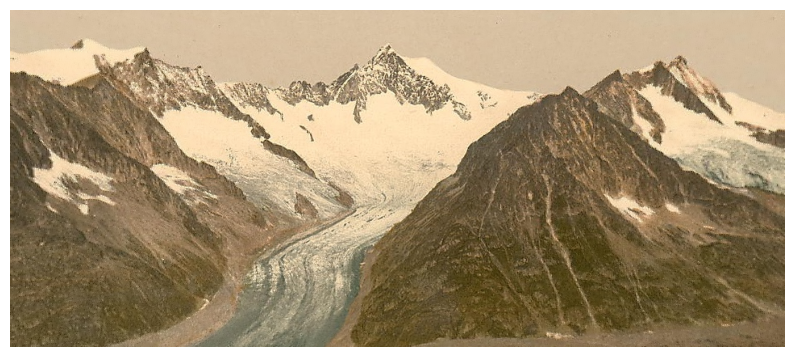

In [13]:
fig = plt.figure(figsize=(10,10))
# plt.imshow(img_dst.astype(np.uint8)[:,:,::-1])
plt.imshow(img_dst_fwd_inpaint[:,:,::-1])
plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.savefig('./Outputs/image_withDistortion.png', bbox_inches='tight', dpi=300)
plt.show()

# Raster DEM Keypoints

In [6]:
DEM_DataArray, GDAL_GeoTransform = processDEMraster("data/AletschGlacierDEM.tiff")

GeoPointCloud_path = os.path.join('large-size-data/', 'Mountain_PointCloud_no_deletion.out')
DEMPointCloud = createGeoPointCloudfromDEM(filePath='data/AletschGlacierDEM.tiff', outputPath=GeoPointCloud_path, saveoutput=False)

# PointCloudVisualizer(PointCloudFilePath=GeoPointCloud_path, width=3024, height=1964)

In [7]:
DEM_Image_path = os.path.join('data/', 'DEM_Image_Gray_No_deletion.jpg')
if not os.path.isfile(DEM_Image_path):
    createDEMimage('data/AletschGlacierDEM.tiff', DEM_Image_path)
else:
    print(f"The file '{DEM_Image_path}' exists")

The file 'data/DEM_Image_Gray_No_deletion.jpg' exists


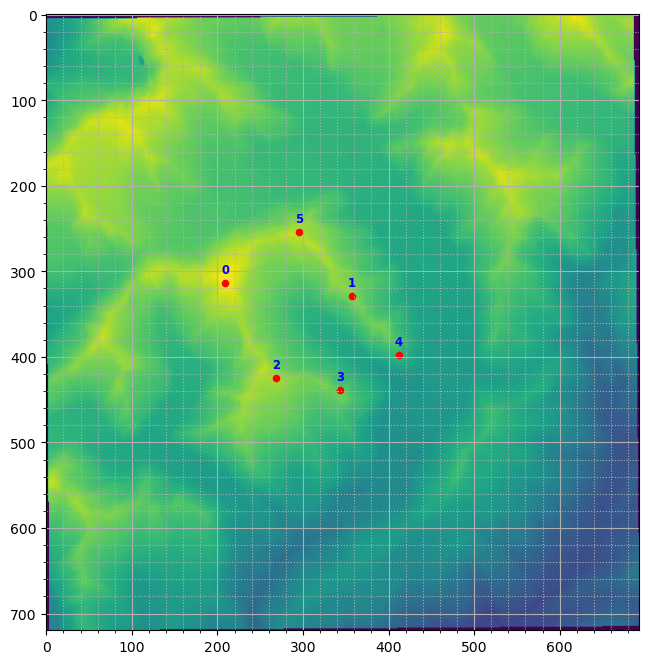

In [8]:
DEM_Image = cv2.imread(DEM_Image_path, cv2.COLOR_BGR2GRAY)

DEM_Raster_keypoint = np.loadtxt('data/DEM_Raster_keypoint.out', delimiter=',').round().astype('int64')
listSelectedDEMKeyPnts = [7 , 17, 20, 21 , 19, 16]
Selected_DEM_Raster_keypoint = DEM_Raster_keypoint[listSelectedDEMKeyPnts]
showImg_and_KeyPoints(DEM_Image, Selected_DEM_Raster_keypoint, pointfill=True, showGrid=True, showPointNumber=True, pointsize=20, figuresize=(8,8), colormap='viridis')

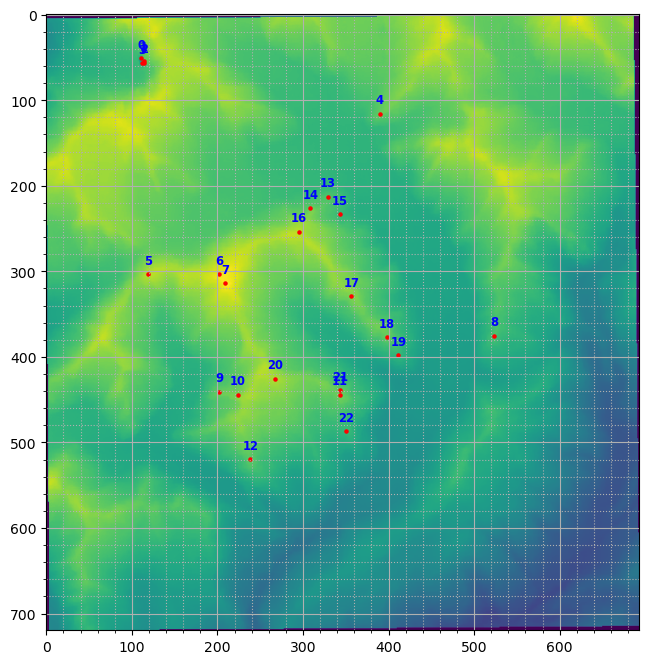

In [9]:
orb_params = {
    "nfeatures": 1000,
    "scaleFactor": 1.9,
    "nlevels": 8
}
keypoints, descriptors = DEMrasterKeypointFinder(DEM_Image, orb_params)

showImg_and_KeyPoints(DEM_Image, keypoints, pointfill=True, showGrid=True, showPointNumber=True,
                      pointsize=5, figuresize=(8,8), colormap='viridis')

/opt/miniconda3/envs/py311Monoplotting/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


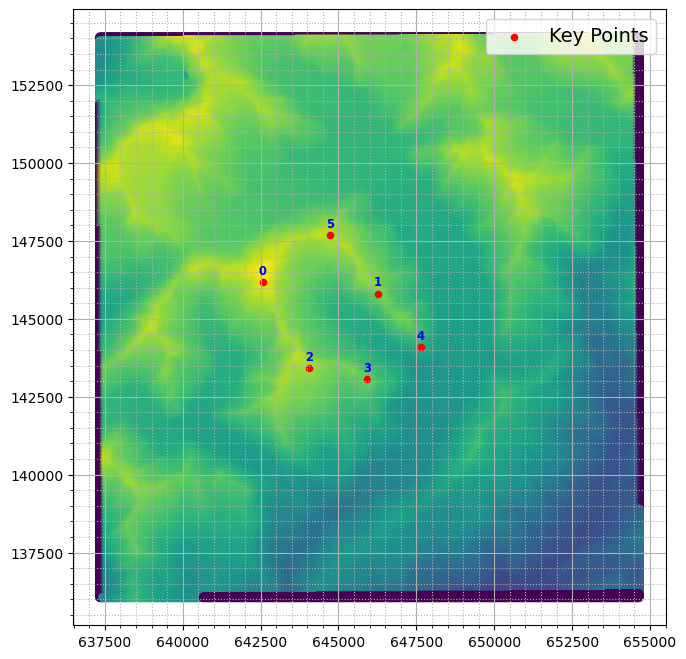

In [10]:
Geo_Keypoints = DEMrasterKeyPointsToGeoKeyPoints(Selected_DEM_Raster_keypoint, DEM_DataArray, GDAL_GeoTransform)
showDEM3D_and_KeyPoints(DEMPointCloud, Geo_Keypoints, pointfill=True, showGrid=True, showPointNumber=True, pointsize=20, figuresize=(8,8), colormap='viridis')

# Optimization

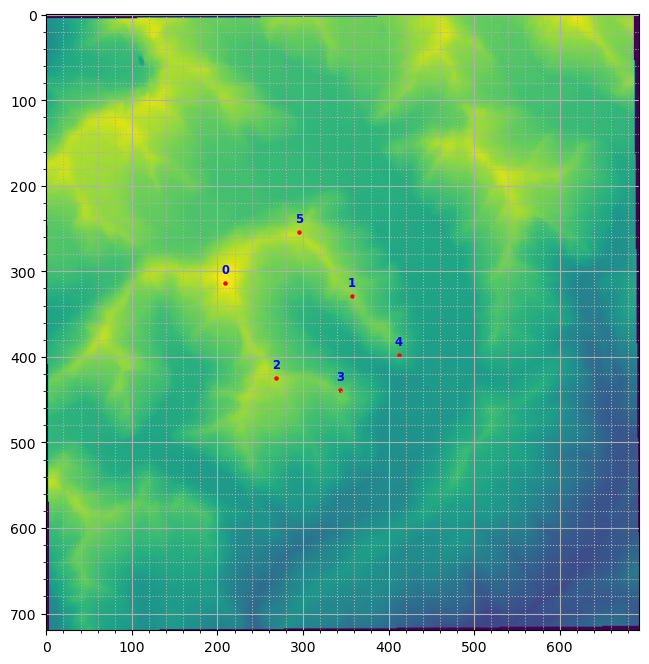

In [11]:
showImg_and_KeyPoints(DEM_Image, Selected_DEM_Raster_keypoint, pointfill=True, showGrid=True, showPointNumber=True,
                      pointsize=5, figuresize=(8,8), colormap='viridis')

selectedGeoKeypoints = DEMrasterKeyPointsToGeoKeyPoints(Selected_DEM_Raster_keypoint, DEM_DataArray, GDAL_GeoTransform)

# showDEM3D_and_KeyPoints(DEMPointCloud, selectedGeoKeypoints,
#                         pointfill=True, showGrid=True, showPointNumber=True, pointsize=5, figuresize=(8,8), colormap='viridis')

In [12]:
# Pmodel = ProjectModel(659300, 143700, 2900, 260, -60, -1, 25)
# Pmodel = ProjectModel(649323.4946735367, 142744.31005438883, 2805.999091620659, 269.69094211, -62.23, -0.369, 26.45)

# Pmodel = ProjectModelWithDistortion(649323.4946735367, 142744.31005438883, 2805.999091620659, 269.69094211, -62.23, -0.369, 26.45, 0.0)
Pmodel = ProjectModelWithDistortion(649253.3703265093 , 142865.74087840022 , 2781.9652130011195 , 269.11301061632224 , -62.99324257205183 , 0.1651217563637059 , 26.439222920783102, 1.1999999999999985e-06)


In [13]:
LRAdap = .05

# optimizer = torch.optim.Adadelta(Pmodel.parameters(), lr=LRAdap, rho=0.9, eps=1e-06)
params_main = []
for name, param in Pmodel.named_parameters():
    if name != "Kdist":  # name or check by param is fine
        params_main.append(param)

optimizer = torch.optim.Adadelta(params_main, lr=LRAdap, rho=0.9, eps=1e-06)

scheduler = torch.optim.lr_scheduler.MultiStepLR(optimizer, milestones=[10000], gamma=0.5)

In [14]:
%%time
import time
t0 = time.time()
loss_history = []
interval_check = 2000
plot_interval = 10000

t=0
while True:

    loss_P = Pmodel(img_dst_fwd_inpaint, selectedGeoKeypoints, distortedPoints_fwd)
    loss_history.append(loss_P.item())

    if t % interval_check == 0:
        print(Pmodel.Loss.detach().numpy().round(2), Pmodel.Kdist.detach().numpy())

    # if t % plot_interval == 0:
    #     projectedPoints = Pmodel.uv_final.detach().numpy()
    #     showImg_and_KeyPoints_and_projectedPoints(img, 
    #     Selected_Image_keypoints,
    #     projectedPoints,
    #     showPointNumber=True, pointsize=60)

    # Zero gradients, perform a backward pass, and update the weights.
    optimizer.zero_grad()
    loss_P.backward()
        # 1) Update the main params with Adadelta
    optimizer.step()

    # 2) Manually update Kdist with a fixed step
    with torch.no_grad():
        Pmodel.Kdist -= 1e-8 * Pmodel.Kdist.grad.sign()
        Pmodel.Kdist.grad.zero_()
        

    t+=1
    # scheduler.step()

loss_history = np.array(loss_history)

t1 = time.time()
RunTime = t1-t0
print("Running Time", RunTime)

73.86 1.1999999999999985e-06
70.32 1.1599999999999988e-06


KeyboardInterrupt: 

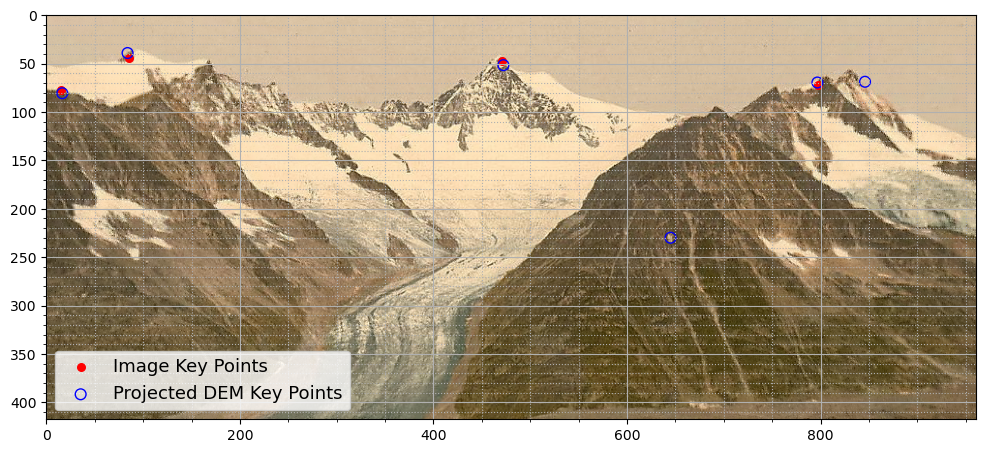

In [15]:
projectedPoints = Pmodel.uv_final_distorted.detach().numpy()
# showImg_and_KeyPoints_and_projectedPoints(img_dst_fwd_inpaint, 
#         distortedPoints_fwd,
#         projectedPoints,
#         showPointNumber=False, pointsize=60)

showImg_and_KeyPoints_and_projectedPoints(img_dst_fwd_inpaint, 
        distortedPoints_fwd,
        projectedPoints,
        showPointNumber=False, pointsize=60,
        showLegend=True,
        fontsize=13,
        saveTofile=True, filePath='./Outputs/optimizationResult_withDistortion.png')

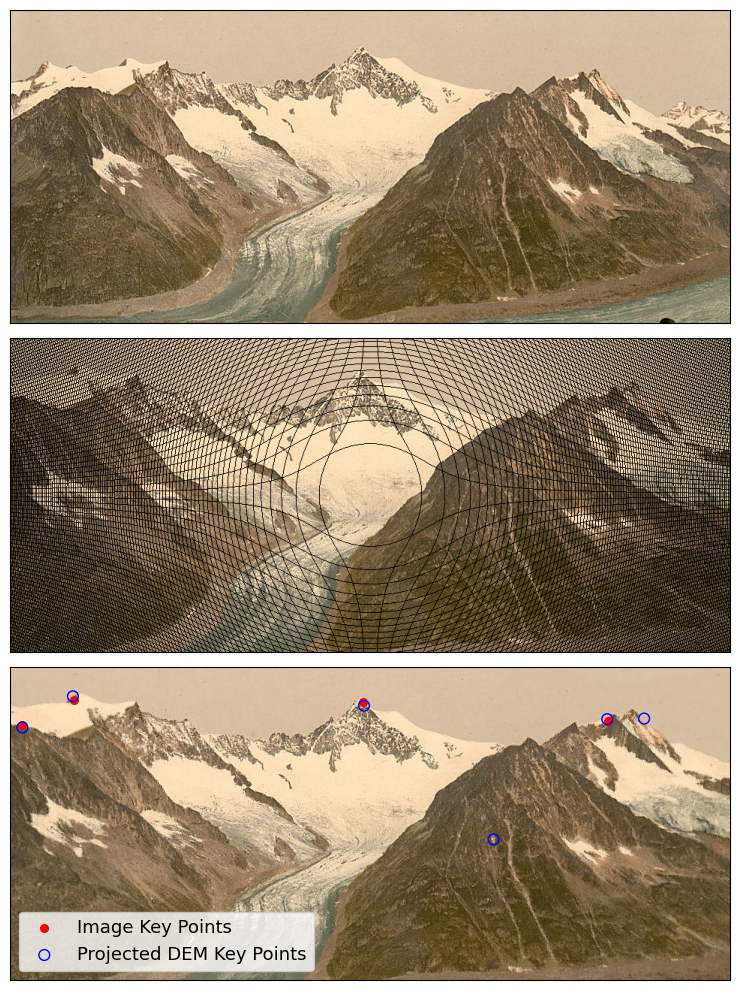

In [17]:
fig, axs = plt.subplots(3, 1, figsize=(17, 10))

axs[0].imshow(img[:,:,::-1])
axs[0].set_xticks([])
axs[0].set_yticks([])

axs[1].imshow(img_dst.astype(np.uint8)[:,:,::-1])
axs[1].set_xticks([])
axs[1].set_yticks([])

showImg_and_KeyPoints_and_projectedPoints(img_dst_fwd_inpaint, 
        distortedPoints_fwd,
        projectedPoints,
        showPointNumber=False, pointsize=60,
        showLegend=True,
        fontsize=13,
        saveTofile=False, ax=axs[2])

# axs[2].imshow(img_dst_fwd_inpaint[:,:,::-1])
axs[2].set_xticks([])
axs[2].set_yticks([])

plt.tight_layout()

plt.savefig('./Outputs/Distortion.png', bbox_inches='tight', dpi=300)
plt.show()

In [20]:
print(Pmodel.Cam_x.detach().numpy(),',', Pmodel.Cam_y.detach().numpy(),',', Pmodel.Cam_z.detach().numpy(), ',',
      Pmodel.theta1.detach().numpy(),',', Pmodel.theta2.detach().numpy(),',', Pmodel.theta3.detach().numpy(), ',',
      Pmodel.ViewAngle.detach().numpy(), Pmodel.Kdist.detach().numpy())

649252.8766280197 , 142866.0641892444 , 2781.7455843220873 , 269.09021987065984 , -62.981940732180426 , 0.17459257588919738 , 26.35010288907629 1.1699999999999988e-06


# Back Projection

In [112]:
Loc = np.array([Pmodel.Cam_x.detach().numpy(), Pmodel.Cam_y.detach().numpy(), Pmodel.Cam_z.detach().numpy()])

OCV_Angles = np.array([Pmodel.theta1.detach().numpy(), Pmodel.theta2.detach().numpy(), Pmodel.theta3.detach().numpy()])
O3D_Angles = OpenGLandCV_to_Open3D_Angles_deg(OCV_Angles)
CPose_pitch_x, CPose_heading_y, CPose_roll_z = O3D_Angles
Angles = np.array([CPose_pitch_x, CPose_heading_y, CPose_roll_z])

FOV = Pmodel.ViewAngle.detach().numpy()
# FOV = 26


pathMesh = "large-size-data/Final_refined_Mesh.stl"
FinalRefinedMesh = o3d.io.read_triangle_mesh(pathMesh)
FinalRefinedMesh.remove_duplicated_vertices()
FinalRefinedMesh.remove_duplicated_triangles()

Vertices = np.asarray(FinalRefinedMesh.vertices)
TrianglesIndex = np.asarray(FinalRefinedMesh.triangles)
Triangles = Vertices[TrianglesIndex]

CamParams, renderedIMG, depthimage = Custom_Visualizer_CameraPose_FOV_Complete(FinalRefinedMesh,
                                                      Loc[0],Loc[1],Loc[2],
                                                      Angles[0],Angles[1],Angles[2],
                                                      FOV, Pmodel.width_img, Pmodel.height_img)

renderedIMG = (np.array(renderedIMG)*255).round().astype('uint8')
renderedIMG_fwd_inpaint,_ = forwardMappingImageDistortion(renderedIMG, Pmodel.Kdist.detach().numpy())


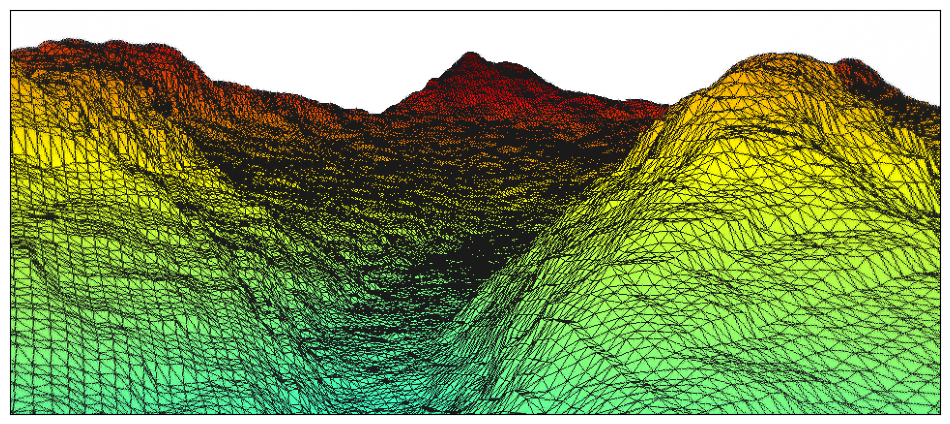

In [113]:
fig = plt.figure(figsize=(12,15))
plt.imshow(renderedIMG_fwd_inpaint)
plt.xticks([])
plt.yticks([])
plt.savefig('./Outputs/renderedImage_withDistortion.png', bbox_inches='tight', dpi=300)
plt.show()

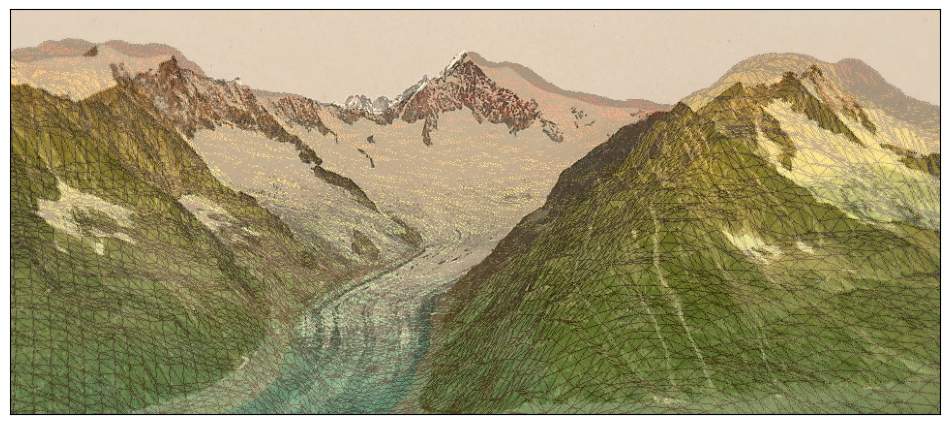

In [114]:
fig = plt.figure(figsize=(12,15))
plt.imshow(renderedIMG_fwd_inpaint)
plt.imshow(img_dst_fwd_inpaint[:,:,::-1], alpha=0.75)
plt.xticks([])
plt.yticks([])
# plt.savefig('./Outputs/renderedImageOverlayed_withDistortion.png', bbox_inches='tight', dpi=300)
plt.show()


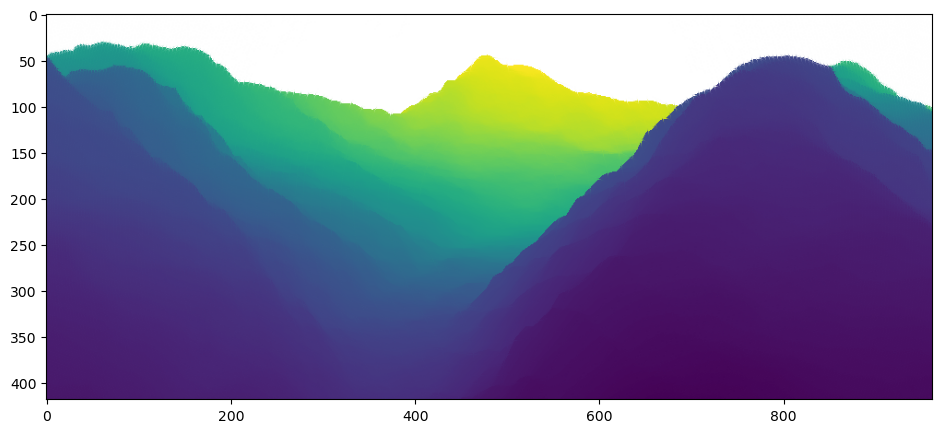

In [122]:
depthImg_nonZero = depthimage.copy()
depthImg_nonZero[depthImg_nonZero==0.0] = np.nan

depthImg_rgb = convert2DarrayToImageRGB(depthImg_nonZero)
depthImg_rgb_fwd_inpaint,_ = forwardMappingImageDistortion(depthImg_rgb, Pmodel.Kdist.detach().numpy())


fig = plt.figure(figsize=(14,5))
plt.imshow(depthImg_rgb_fwd_inpaint)
# plt.xticks([])
# plt.yticks([])
plt.show()

In [185]:
u_ind, v_ind = np.where(~np.isnan(depthImg_nonZero))
uv_indices_depthImg = torch.tensor(np.hstack([v_ind.reshape(-1,1), u_ind.reshape(-1,1)]))

xyzPoints_backProj_depthImge = TorchBackProjection(uv_indices_depthImg, depthimage,
                                        Pmodel.Cam_x.detach(), Pmodel.Cam_y.detach(), Pmodel.Cam_z.detach(),
                                        Pmodel.theta1.detach(), Pmodel.theta2.detach(), Pmodel.theta3.detach(),
                                        Pmodel.ViewAngle.detach())
                                        

X_image = depthImg_nonZero.copy()
X_image[u_ind, v_ind] = xyzPoints_backProj_depthImge[:,0]
X_image_rgb = convert2DarrayToImageRGB(X_image)
X_image_rgb_dist,_ = forwardMappingImageDistortion(X_image_rgb, Pmodel.Kdist.detach().numpy())

Y_image = depthImg_nonZero.copy()
Y_image[u_ind, v_ind] = xyzPoints_backProj_depthImge[:,1]
Y_image_rgb = convert2DarrayToImageRGB(Y_image)
Y_image_rgb_dist,_ = forwardMappingImageDistortion(Y_image_rgb, Pmodel.Kdist.detach().numpy())

Z_image = depthImg_nonZero.copy()
Z_image[u_ind, v_ind] = xyzPoints_backProj_depthImge[:,2]
Z_image_rgb = convert2DarrayToImageRGB(Z_image)
Z_image_rgb_dist,_ = forwardMappingImageDistortion(Z_image_rgb, Pmodel.Kdist.detach().numpy())

/var/folders/5b/h5j62kgx4sz37nc57zszjl3r0000gn/T/ipykernel_59245/2987026086.py:18: UserWarning: Adding colorbar to a different Figure <Figure size 750x900 with 6 Axes> than <Figure size 750x900 with 4 Axes> which fig.colorbar is called on.
  cbar2 = plt.colorbar(im[i], ax=axs2[i], shrink=1, pad=0)
/var/folders/5b/h5j62kgx4sz37nc57zszjl3r0000gn/T/ipykernel_59245/2987026086.py:18: UserWarning: Adding colorbar to a different Figure <Figure size 750x900 with 6 Axes> than <Figure size 750x900 with 5 Axes> which fig.colorbar is called on.
  cbar2 = plt.colorbar(im[i], ax=axs2[i], shrink=1, pad=0)
/var/folders/5b/h5j62kgx4sz37nc57zszjl3r0000gn/T/ipykernel_59245/2987026086.py:18: UserWarning: Adding colorbar to a different Figure <Figure size 750x900 with 6 Axes> than <Figure size 750x900 with 6 Axes> which fig.colorbar is called on.
  cbar2 = plt.colorbar(im[i], ax=axs2[i], shrink=1, pad=0)


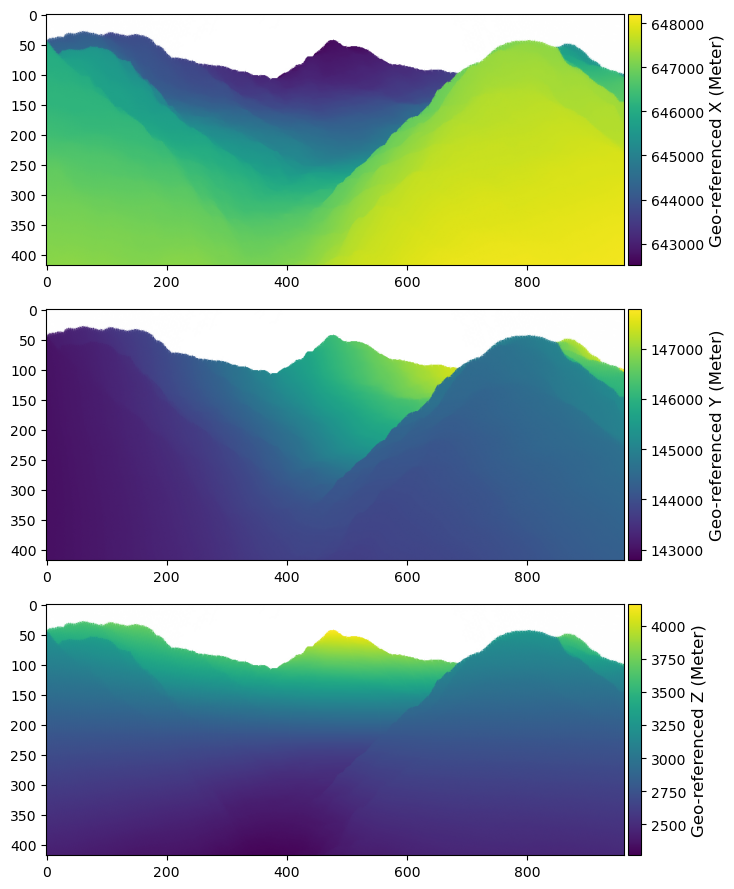

In [197]:
XYZ_images = [X_image, Y_image, Z_image]
im = []
fig, axs = plt.subplots(3, 1, figsize=(7.5, 9))
for i in range(len(XYZ_images)):
    coordImg = XYZ_images[i]
    im.append(axs[i].imshow(coordImg))
    cbar = plt.colorbar(im[i], ax=axs[i], shrink=1, pad=0)
plt.close(fig)

XYZ_images = [X_image_rgb_dist, Y_image_rgb_dist, Z_image_rgb_dist]
XYZ_labels = ['X', 'Y', 'Z']

fig, axs2 = plt.subplots(3, 1, figsize=(7.5, 9))
for i in range(len(XYZ_labels)):

    coordImg = XYZ_images[i]
    axs2[i].imshow(coordImg)
    cbar2 = plt.colorbar(im[i], ax=axs2[i], shrink=1, pad=0)
    cbar2.set_label('Geo-referenced '+XYZ_labels[i]+' (Meter)', rotation=90, fontsize=12)
    axs2[i].axis('scaled')
plt.tight_layout() 
plt.savefig('Outputs/XYZ_images_distorted.png', bbox_inches='tight', dpi=300)
plt.show()

/var/folders/5b/h5j62kgx4sz37nc57zszjl3r0000gn/T/ipykernel_59245/140973791.py:8: UserWarning: Adding colorbar to a different Figure <Figure size 750x900 with 9 Axes> than <Figure size 1200x1200 with 2 Axes> which fig.colorbar is called on.
  cbar = plt.colorbar(im[i], ax=ax, shrink=0.370, pad=0.02)


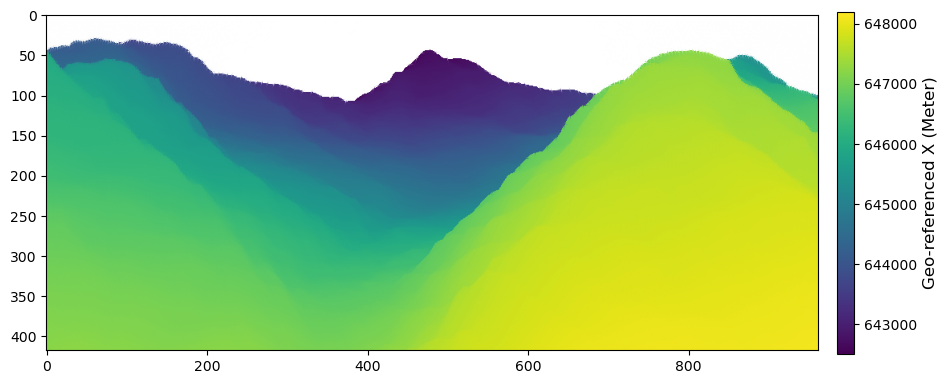

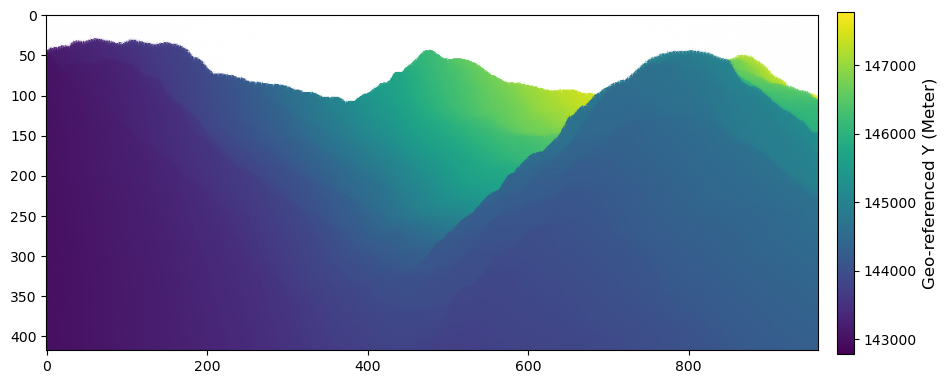

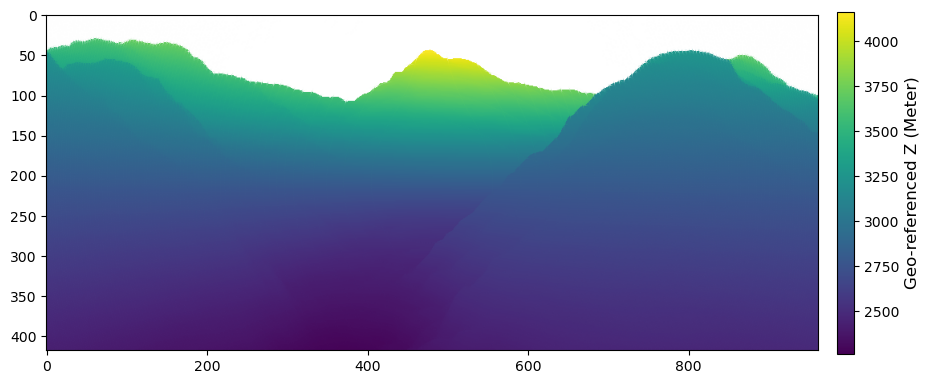

In [195]:
XYZ_images = [X_image_rgb_dist, Y_image_rgb_dist, Z_image_rgb_dist]
XYZ_labels = ['X', 'Y', 'Z']
for i in range(len(XYZ_labels)):

    fig, ax = plt.subplots(figsize=(12,12))
    coordImg = XYZ_images[i]
    ax.imshow(coordImg)
    cbar = plt.colorbar(im[i], ax=ax, shrink=0.370, pad=0.02)
    cbar.set_label('Geo-referenced '+XYZ_labels[i]+' (Meter)', rotation=90, fontsize=12)
    ax.axis('scaled')
    plt.savefig('Outputs/'+XYZ_labels[i]+'_image_distorted.png', bbox_inches='tight', dpi=300)

plt.show()

# Monoplotting

In [203]:
snowmask = np.load('data/Mountain_cropped_binaryMask_snow.npy')

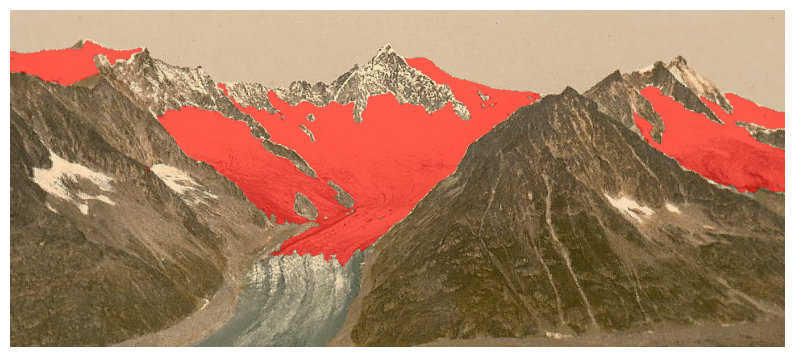

In [204]:
u_ind_snow, v_ind_snow = np.where(snowmask)
uv_indices_snow = torch.tensor(np.hstack([v_ind_snow.reshape(-1,1), u_ind_snow.reshape(-1,1)]))

snowmask_dist, _ = forwardMappingImageDistortion(np.expand_dims(snowmask*255, axis=2), k_distortion_forward)

snowmask_rgb_dist_binary = np.where(snowmask_dist >= 128, 255, 0)
snowmask_rgb_dist_binary = snowmask_rgb_dist_binary[:,:,0]==255

plt.figure(figsize=(10,10))
plt.imshow(img_dst_fwd_inpaint[:,:,::-1])
show_mask(snowmask_rgb_dist_binary, plt.gca(), alpha=0.6)
plt.axis('off')
plt.savefig('Outputs/snow_segmented_mountain_withDistortion.png', bbox_inches='tight', dpi=300)

plt.show()

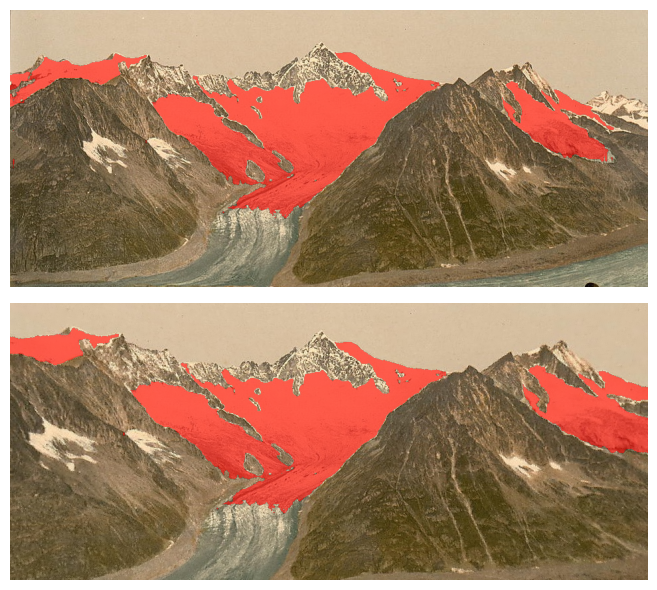

In [218]:
fig, axs = plt.subplots(2, 1, figsize=(7, 6))

axs[0].imshow(img[:,:,::-1])
show_mask(snowmask, axs[0], alpha=0.6)
axs[0].axis('off')

axs[1].imshow(img_dst_fwd_inpaint[:,:,::-1])
show_mask(snowmask_rgb_dist_binary, axs[1], alpha=0.6)
axs[1].axis('off')

plt.tight_layout() 
plt.savefig('Outputs/snow_segmented_mountain_withANDwithoutDistortion.png', bbox_inches='tight', dpi=300)

plt.show()